<a href="https://colab.research.google.com/github/jm042524/Prog2kakushin/blob/main/work1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##テーマ：Pandas
好きな歌手の曲によく出てくる単語を表示するプログラムを作成します。(Pandasとmatplotlib)

In [53]:
#コード：
import pandas as pd
import numpy
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
import nltk
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image, ImageDraw, ImageFont
from google.colab.patches import cv2_imshow


data = pd.read_csv("Songs.csv")

In [ ]:
# data.head()
data.head()

,Artist,Title,Lyrics
0,Taylor Swift,cardigan,"Vintage tee, brand new phone\nHigh heels on co..."
1,Taylor Swift,exile,"I can see you standing, honey\nWith his arms a..."
2,Taylor Swift,Lover,We could leave the Christmas lights up 'til Ja...
3,Taylor Swift,the 1,"I'm doing good, I'm on some new shit\nBeen say..."
4,Taylor Swift,Look What You Made Me Do,I don't like your little games\nDon't like you...


In [ ]:
# データに含まれているアーティスト
print("Artists in the data:\n", data.Artist.value_counts())

Artists in the data:
 Taylor Swift          50
David Bowie           50
Billy Joel            50
Eric Clapton          50
Billie Eilish         50
Leonard Cohen         50
Bruce Springsteen     40
The Beatles           35
Ray LaMontagne        30
Elton John            30
Queen                 30
Frank Sinatra         30
John Denver           30
Bryan Adams           30
​twenty one pilots    30
Nat King Cole         30
Lana Del Rey          30
Vance Joy             30
George Michael        30
Bob Dylan             20
Ed Sheeran            20
Name: Artist, dtype: int64


In [ ]:
# データの形
print("Size of Dataset:", data.shape)

Size of Dataset: (745, 3)


In [ ]:
# 文字数、語数、行数の列を作る
data["No_of_Characters"] = data["Lyrics"].apply(len)
data["No_of_Words"] = data.apply(lambda row: nltk.word_tokenize(row["Lyrics"]), axis=1).apply(len)
data["No_of_Lines"] = data["Lyrics"].str.split('\n').apply(len)
data.describe()

,No_of_Characters,No_of_Words,No_of_Lines
count,745.000000,745.000000,745.000000
mean,1403.347651,319.400000,46.277852
std,666.721467,156.163646,21.180531
min,1.000000,1.000000,1.000000
25%,946.000000,215.000000,33.000000
50%,1289.000000,291.000000,44.000000
75%,1714.000000,389.000000,56.000000
max,7267.000000,1652.000000,224.000000


<Figure size 1080x1080 with 0 Axes>

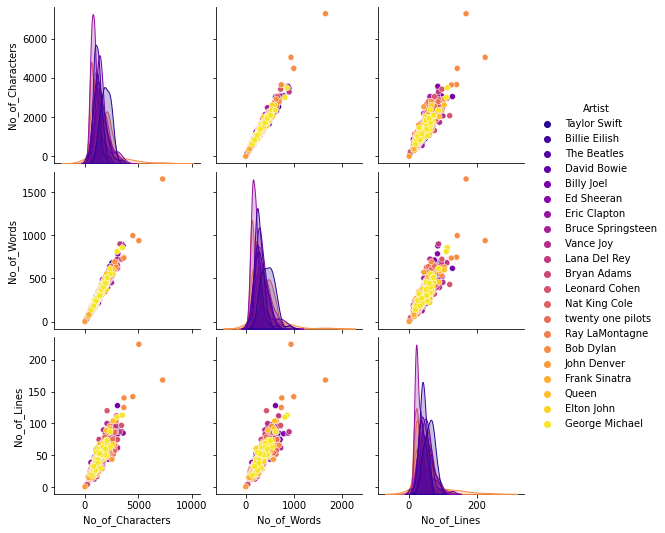

In [ ]:
# アーティストの曲の長さを比較
plt.figure(figsize=(15,15))
ax = sns.pairplot(data, hue="Artist", palette="plasma")
plt.show()

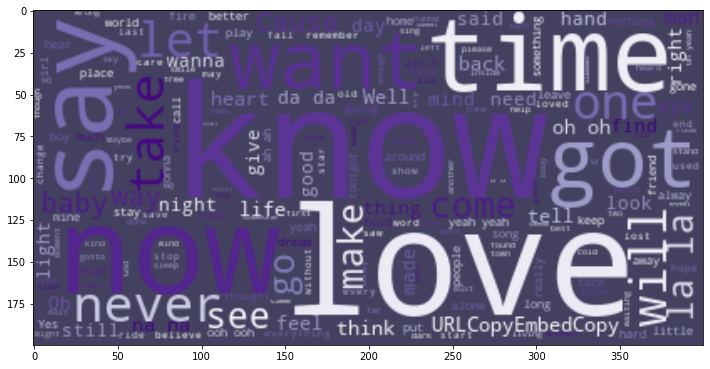

In [ ]:
# 頻度の高い言葉を大きく表示する
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="#444160",colormap="Purples", max_words=800).generate(" ".join(data["Lyrics"]))
plt.figure(figsize=(12,12))
plt.imshow(wordcloud, interpolation="bilinear")
plt.show()

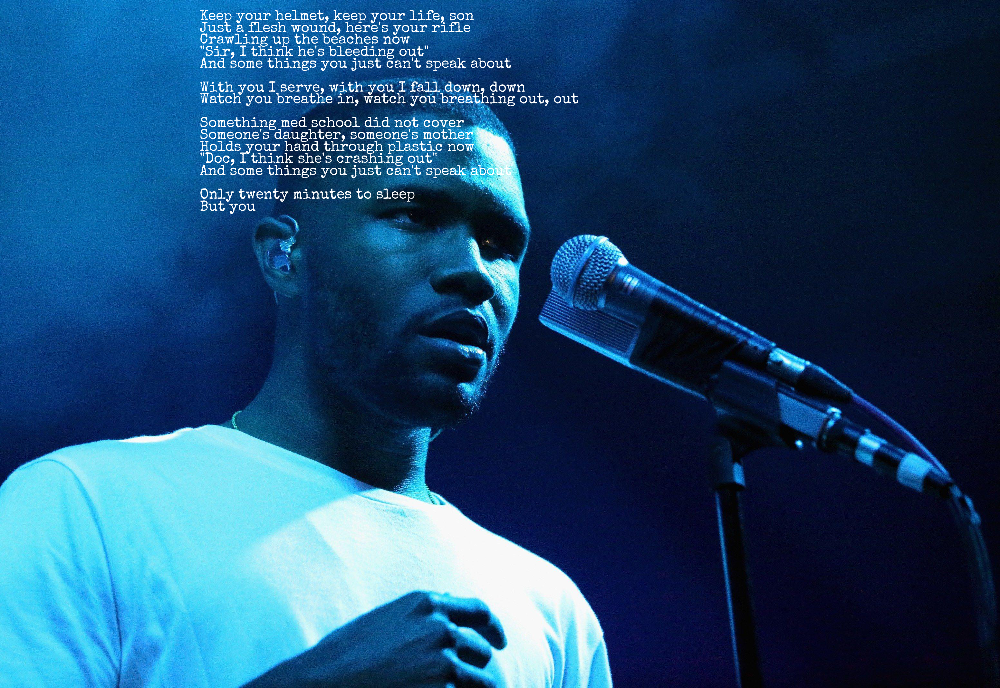

In [43]:
#ある曲の最初の500文字を指定写真上に表示
def My_song(song):
    img = Image.open("frankOcean.jpg")
    Text_on_image = ImageDraw.Draw(img)
    myFont = ImageFont.truetype("SpecialElite.ttf", 45)
    Text_on_image.text((620, 30), song, font=myFont, fill =(255, 255, 255))
    return img    

My_song(data.Lyrics[42][:500])

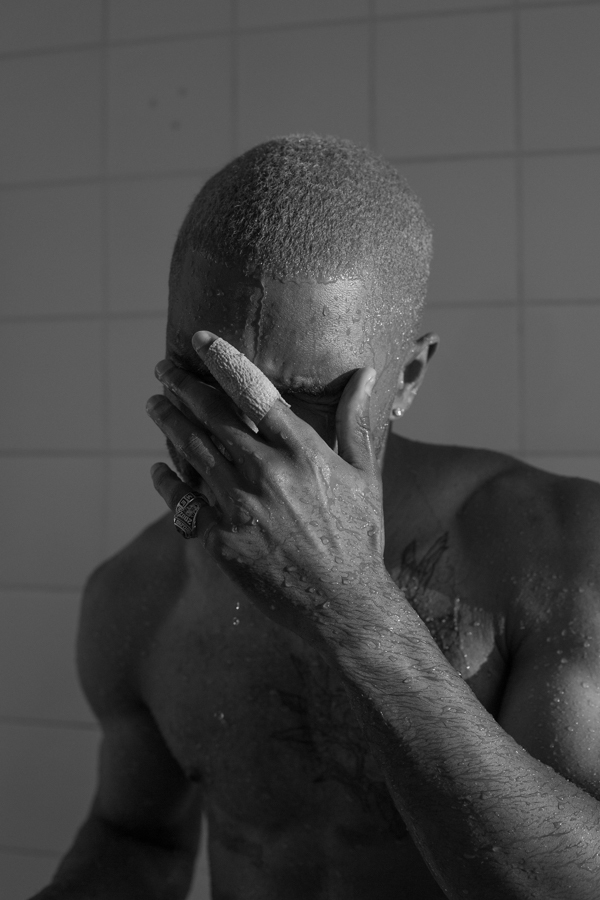

In [55]:
file = "originalBlonde.jpg"
image = cv2.imread(file)
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

height = image.shape[0]
width = image.shape[1]

cv2_imshow(imageGray)